# Sentiment Classification & How To "Frame Problems" for a Neural Network

by Andrew Trask

- **Twitter**: @iamtrask
- **Blog**: http://iamtrask.github.io

### What You Should Already Know

- neural networks, forward and back-propagation
- stochastic gradient descent
- mean squared error
- and train/test splits

### Where to Get Help if You Need it
- Re-watch previous Udacity Lectures
- Leverage the recommended Course Reading Material - [Grokking Deep Learning](https://www.manning.com/books/grokking-deep-learning) (Check inside your classroom for a discount code)
- Shoot me a tweet @iamtrask


### Tutorial Outline:

- Intro: The Importance of "Framing a Problem" (this lesson)

- [Curate a Dataset](#lesson_1)
- [Developing a "Predictive Theory"](#lesson_2)
- [**PROJECT 1**: Quick Theory Validation](#project_1)


- [Transforming Text to Numbers](#lesson_3)
- [**PROJECT 2**: Creating the Input/Output Data](#project_2)


- Putting it all together in a Neural Network (video only - nothing in notebook)
- [**PROJECT 3**: Building our Neural Network](#project_3)


- [Understanding Neural Noise](#lesson_4)
- [**PROJECT 4**: Making Learning Faster by Reducing Noise](#project_4)


- [Analyzing Inefficiencies in our Network](#lesson_5)
- [**PROJECT 5**: Making our Network Train and Run Faster](#project_5)


- [Further Noise Reduction](#lesson_6)
- [**PROJECT 6**: Reducing Noise by Strategically Reducing the Vocabulary](#project_6)


- [Analysis: What's going on in the weights?](#lesson_7)

# Lesson: Curate a Dataset<a id='lesson_1'></a>
The cells from here until Project 1 include code Andrew shows in the videos leading up to mini project 1. We've included them so you can run the code along with the videos without having to type in everything.

In [1]:
def pretty_print_review_and_label(i):
    print(labels[i] + "\t:\t" + reviews[i][:80] + "...")

g = open('reviews.txt','r') # What we know!
reviews = list(map(lambda x:x[:-1],g.readlines()))
g.close()

g = open('labels.txt','r') # What we WANT to know!
labels = list(map(lambda x:x[:-1].upper(),g.readlines()))
g.close()

**Note:** The data in `reviews.txt` we're using has already been preprocessed a bit and contains only lower case characters. If we were working from raw data, where we didn't know it was all lower case, we would want to add a step here to convert it. That's so we treat different variations of the same word, like `The`, `the`, and `THE`, all the same way.

In [33]:
len(reviews)

25000

In [3]:
reviews[2]

'homelessness  or houselessness as george carlin stated  has been an issue for years but never a plan to help those on the street that were once considered human who did everything from going to school  work  or vote for the matter . most people think of the homeless as just a lost cause while worrying about things such as racism  the war on iraq  pressuring kids to succeed  technology  the elections  inflation  or worrying if they  ll be next to end up on the streets .  br    br   but what if you were given a bet to live on the streets for a month without the luxuries you once had from a home  the entertainment sets  a bathroom  pictures on the wall  a computer  and everything you once treasure to see what it  s like to be homeless  that is goddard bolt  s lesson .  br    br   mel brooks  who directs  who stars as bolt plays a rich man who has everything in the world until deciding to make a bet with a sissy rival  jeffery tambor  to see if he can live in the streets for thirty days w

In [4]:
labels[2]

'POSITIVE'

# Lesson: Develop a Predictive Theory<a id='lesson_2'></a>

In [5]:
print("labels.txt \t : \t reviews.txt\n")
pretty_print_review_and_label(2137)
pretty_print_review_and_label(12816)
pretty_print_review_and_label(6267)
pretty_print_review_and_label(21934)
pretty_print_review_and_label(5297)
pretty_print_review_and_label(4998)

labels.txt 	 : 	 reviews.txt

NEGATIVE	:	this movie is terrible but it has some good effects .  ...
POSITIVE	:	adrian pasdar is excellent is this film . he makes a fascinating woman .  ...
NEGATIVE	:	comment this movie is impossible . is terrible  very improbable  bad interpretat...
POSITIVE	:	excellent episode movie ala pulp fiction .  days   suicides . it doesnt get more...
NEGATIVE	:	if you haven  t seen this  it  s terrible . it is pure trash . i saw this about ...
POSITIVE	:	this schiffer guy is a real genius  the movie is of excellent quality and both e...


# Project 1: Quick Theory Validation<a id='project_1'></a>

There are multiple ways to implement these projects, but in order to get your code closer to what Andrew shows in his solutions, we've provided some hints and starter code throughout this notebook.

You'll find the [Counter](https://docs.python.org/2/library/collections.html#collections.Counter) class to be useful in this exercise, as well as the [numpy](https://docs.scipy.org/doc/numpy/reference/) library.

In [6]:
from collections import Counter
import numpy as np

We'll create three `Counter` objects, one for words from postive reviews, one for words from negative reviews, and one for all the words.

In [7]:
# Create three Counter objects to store positive, negative and total counts
positive_counts = Counter()
negative_counts = Counter()
total_counts = Counter()

**TODO:** Examine all the reviews. For each word in a positive review, increase the count for that word in both your positive counter and the total words counter; likewise, for each word in a negative review, increase the count for that word in both your negative counter and the total words counter.

**Note:** Throughout these projects, you should use `split(' ')` to divide a piece of text (such as a review) into individual words. If you use `split()` instead, you'll get slightly different results than what the videos and solutions show.

In [8]:
# TODO: Loop over all the words in all the reviews and increment the counts in the appropriate counter objects
for i in range(len(reviews)):
    words = reviews[i].split(" ")
    if labels[i]=="POSITIVE":
        for word in reviews[i].split(" "):
            positive_counts[word]+=1
            total_counts[word]+=1
    else :
        for word in reviews[i].split(" "):
            negative_counts[word]+=1
            total_counts[word]+=1

Run the following two cells to list the words used in positive reviews and negative reviews, respectively, ordered from most to least commonly used. 

In [9]:
# Examine the counts of the most common words in positive reviews
positive_counts.most_common()

[('', 550468),
 ('the', 173324),
 ('.', 159654),
 ('and', 89722),
 ('a', 83688),
 ('of', 76855),
 ('to', 66746),
 ('is', 57245),
 ('in', 50215),
 ('br', 49235),
 ('it', 48025),
 ('i', 40743),
 ('that', 35630),
 ('this', 35080),
 ('s', 33815),
 ('as', 26308),
 ('with', 23247),
 ('for', 22416),
 ('was', 21917),
 ('film', 20937),
 ('but', 20822),
 ('movie', 19074),
 ('his', 17227),
 ('on', 17008),
 ('you', 16681),
 ('he', 16282),
 ('are', 14807),
 ('not', 14272),
 ('t', 13720),
 ('one', 13655),
 ('have', 12587),
 ('be', 12416),
 ('by', 11997),
 ('all', 11942),
 ('who', 11464),
 ('an', 11294),
 ('at', 11234),
 ('from', 10767),
 ('her', 10474),
 ('they', 9895),
 ('has', 9186),
 ('so', 9154),
 ('like', 9038),
 ('about', 8313),
 ('very', 8305),
 ('out', 8134),
 ('there', 8057),
 ('she', 7779),
 ('what', 7737),
 ('or', 7732),
 ('good', 7720),
 ('more', 7521),
 ('when', 7456),
 ('some', 7441),
 ('if', 7285),
 ('just', 7152),
 ('can', 7001),
 ('story', 6780),
 ('time', 6515),
 ('my', 6488),
 ('g

In [10]:
# Examine the counts of the most common words in negative reviews
negative_counts.most_common()

[('', 561462),
 ('.', 167538),
 ('the', 163389),
 ('a', 79321),
 ('and', 74385),
 ('of', 69009),
 ('to', 68974),
 ('br', 52637),
 ('is', 50083),
 ('it', 48327),
 ('i', 46880),
 ('in', 43753),
 ('this', 40920),
 ('that', 37615),
 ('s', 31546),
 ('was', 26291),
 ('movie', 24965),
 ('for', 21927),
 ('but', 21781),
 ('with', 20878),
 ('as', 20625),
 ('t', 20361),
 ('film', 19218),
 ('you', 17549),
 ('on', 17192),
 ('not', 16354),
 ('have', 15144),
 ('are', 14623),
 ('be', 14541),
 ('he', 13856),
 ('one', 13134),
 ('they', 13011),
 ('at', 12279),
 ('his', 12147),
 ('all', 12036),
 ('so', 11463),
 ('like', 11238),
 ('there', 10775),
 ('just', 10619),
 ('by', 10549),
 ('or', 10272),
 ('an', 10266),
 ('who', 9969),
 ('from', 9731),
 ('if', 9518),
 ('about', 9061),
 ('out', 8979),
 ('what', 8422),
 ('some', 8306),
 ('no', 8143),
 ('her', 7947),
 ('even', 7687),
 ('can', 7653),
 ('has', 7604),
 ('good', 7423),
 ('bad', 7401),
 ('would', 7036),
 ('up', 6970),
 ('only', 6781),
 ('more', 6730),
 ('

As you can see, common words like "the" appear very often in both positive and negative reviews. Instead of finding the most common words in positive or negative reviews, what you really want are the words found in positive reviews more often than in negative reviews, and vice versa. To accomplish this, you'll need to calculate the **ratios** of word usage between positive and negative reviews.

**TODO:** Check all the words you've seen and calculate the ratio of postive to negative uses and store that ratio in `pos_neg_ratios`. 
>Hint: the positive-to-negative ratio for a given word can be calculated with `positive_counts[word] / float(negative_counts[word]+1)`. Notice the `+1` in the denominator – that ensures we don't divide by zero for words that are only seen in positive reviews.

In [34]:
# Create Counter object to store positive/negative ratios
pos_neg_ratios = Counter()

for word,count in list(total_counts.most_common()):
    if count>=100:
        pos_neg_ratios[word] = positive_counts[word]/float(negative_counts[word]+1)
    

# TODO: Calculate the ratios of positive and negative uses of the most common words
#       Consider words to be "common" if they've been used at least 100 times

Examine the ratios you've calculated for a few words:

In [35]:
print("Pos-to-neg ratio for 'the' = {}".format(pos_neg_ratios["the"]))
print("Pos-to-neg ratio for 'amazing' = {}".format(pos_neg_ratios["amazing"]))
print("Pos-to-neg ratio for 'terrible' = {}".format(pos_neg_ratios["terrible"]))

Pos-to-neg ratio for 'the' = 1.0607993145235326
Pos-to-neg ratio for 'amazing' = 4.022813688212928
Pos-to-neg ratio for 'terrible' = 0.17744252873563218


Looking closely at the values you just calculated, we see the following:

* Words that you would expect to see more often in positive reviews – like "amazing" – have a ratio greater than 1. The more skewed a word is toward postive, the farther from 1 its positive-to-negative ratio  will be.
* Words that you would expect to see more often in negative reviews – like "terrible" – have positive values that are less than 1. The more skewed a word is toward negative, the closer to zero its positive-to-negative ratio will be.
* Neutral words, which don't really convey any sentiment because you would expect to see them in all sorts of reviews – like "the" – have values very close to 1. A perfectly neutral word – one that was used in exactly the same number of positive reviews as negative reviews – would be almost exactly 1. The `+1` we suggested you add to the denominator slightly biases words toward negative, but it won't matter because it will be a tiny bias and later we'll be ignoring words that are too close to neutral anyway.

Ok, the ratios tell us which words are used more often in postive or negative reviews, but the specific values we've calculated are a bit difficult to work with. A very positive word like "amazing" has a value above 4, whereas a very negative word like "terrible" has a value around 0.18. Those values aren't easy to compare for a couple of reasons:

* Right now, 1 is considered neutral, but the absolute value of the postive-to-negative rations of very postive words is larger than the absolute value of the ratios for the very negative words. So there is no way to directly compare two numbers and see if one word conveys the same magnitude of positive sentiment as another word conveys negative sentiment. So we should center all the values around netural so the absolute value fro neutral of the postive-to-negative ratio for a word would indicate how much sentiment (positive or negative) that word conveys.
* When comparing absolute values it's easier to do that around zero than one. 

To fix these issues, we'll convert all of our ratios to new values using logarithms.

**TODO:** Go through all the ratios you calculated and convert them to logarithms. (i.e. use `np.log(ratio)`)

In the end, extremely positive and extremely negative words will have positive-to-negative ratios with similar magnitudes but opposite signs.

In [36]:
# TODO: Convert ratios to logs
for word,ratio in pos_neg_ratios.most_common():
#     print ("Word ",word," Ratio ",ratio)
    if ratio>1:
        pos_neg_ratios[word] = np.log(ratio)
    else: pos_neg_ratios[word] = -np.log((1/(ratio+0.01)))
 

Examine the new ratios you've calculated for the same words from before:

In [37]:
print("Pos-to-neg ratio for 'the' = {}".format(pos_neg_ratios["the"]))
print("Pos-to-neg ratio for 'amazing' = {}".format(pos_neg_ratios["amazing"]))
print("Pos-to-neg ratio for 'terrible' = {}".format(pos_neg_ratios["terrible"]))

Pos-to-neg ratio for 'the' = 0.05902269426102881
Pos-to-neg ratio for 'amazing' = 1.3919815802404802
Pos-to-neg ratio for 'terrible' = -1.6742829939664696


If everything worked, now you should see neutral words with values close to zero. In this case, "the" is near zero but slightly positive, so it was probably used in more positive reviews than negative reviews. But look at "amazing"'s ratio - it's above `1`, showing it is clearly a word with positive sentiment. And "terrible" has a similar score, but in the opposite direction, so it's below `-1`. It's now clear that both of these words are associated with specific, opposing sentiments.

Now run the following cells to see more ratios. 

The first cell displays all the words, ordered by how associated they are with postive reviews. (Your notebook will most likely truncate the output so you won't actually see *all* the words in the list.)

The second cell displays the 30 words most associated with negative reviews by reversing the order of the first list and then looking at the first 30 words. (If you want the second cell to display all the words, ordered by how associated they are with negative reviews, you could just write `reversed(pos_neg_ratios.most_common())`.)

You should continue to see values similar to the earlier ones we checked – neutral words will be close to `0`, words will get more positive as their ratios approach and go above `1`, and words will get more negative as their ratios approach and go below `-1`. That's why we decided to use the logs instead of the raw ratios.

In [15]:
# words most frequently seen in a review with a "POSITIVE" label
pos_neg_ratios.most_common()

[('edie', 4.6913478822291435),
 ('paulie', 4.07753744390572),
 ('felix', 3.152736022363656),
 ('polanski', 2.8233610476132043),
 ('matthau', 2.80672172860924),
 ('victoria', 2.681021528714291),
 ('mildred', 2.6026896854443837),
 ('gandhi', 2.538973871058276),
 ('flawless', 2.451005098112319),
 ('superbly', 2.26002547857525),
 ('perfection', 2.159484249353372),
 ('astaire', 2.1400661634962708),
 ('captures', 2.038619547159581),
 ('voight', 2.030170492673053),
 ('wonderfully', 2.0218960560332353),
 ('powell', 1.978345424808467),
 ('brosnan', 1.9547990964725592),
 ('lily', 1.9203768470501485),
 ('bakshi', 1.9029851043382795),
 ('lincoln', 1.9014583864844796),
 ('refreshing', 1.8551812956655511),
 ('breathtaking', 1.8481124057791867),
 ('bourne', 1.8478489358790986),
 ('lemmon', 1.8458266904983307),
 ('delightful', 1.8002701588959635),
 ('flynn', 1.7996646487351682),
 ('andrews', 1.7764919970972666),
 ('homer', 1.7692866133759964),
 ('beautifully', 1.7626953362841438),
 ('soccer', 1.757857

In [16]:
# words most frequently seen in a review with a "NEGATIVE" label
list(reversed(pos_neg_ratios.most_common()))

# Note: Above is the code Andrew uses in his solution video, 
#       so we've included it here to avoid confusion.
#       If you explore the documentation for the Counter class, 
#       you will see you could also find the 30 least common
#       words like this: pos_neg_ratios.most_common()[:-31:-1]

[('boll', -4.07781526027089),
 ('uwe', -3.921875301871158),
 ('seagal', -3.320250105858192),
 ('unwatchable', -3.0269848170580955),
 ('stinker', -2.9876839403711624),
 ('mst', -2.775383321170797),
 ('incoherent', -2.7641396677532537),
 ('unfunny', -2.5545257844967644),
 ('waste', -2.4907515123361046),
 ('blah', -2.4475792789485005),
 ('horrid', -2.371577964480997),
 ('pointless', -2.345107387713634),
 ('atrocious', -2.3187369339642556),
 ('redeeming', -2.2667790015910296),
 ('prom', -2.2601040980178784),
 ('drivel', -2.247602958576693),
 ('lousy', -2.2118080125207054),
 ('worst', -2.1930856334332267),
 ('laughable', -2.172468615469592),
 ('awful', -2.1385076866397488),
 ('poorly', -2.132613384420701),
 ('wasting', -2.117815554561451),
 ('remotely', -2.111046881095167),
 ('existent', -2.0024805005437076),
 ('boredom', -1.9241486572738005),
 ('miserably', -1.921661093801999),
 ('sucks', -1.9166645809588516),
 ('uninspired', -1.9131499212248517),
 ('lame', -1.9117232884159072),
 ('insult'

# End of Project 1. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Transforming Text into Numbers<a id='lesson_3'></a>
The cells here include code Andrew shows in the next video. We've included it so you can run the code along with the video without having to type in everything.

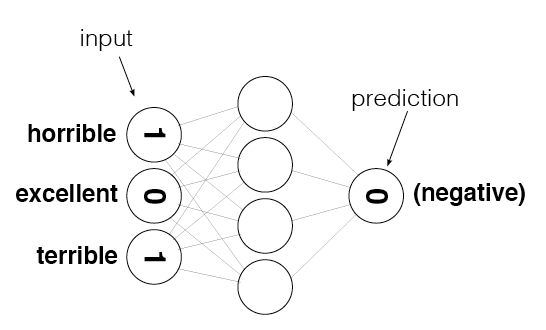

In [38]:
from IPython.display import Image

review = "This was a horrible, terrible movie."

Image(filename='sentiment_network.png')

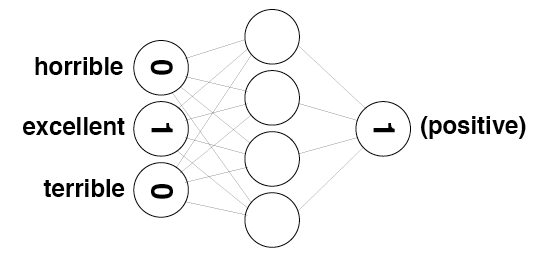

In [18]:
review = "The movie was excellent"

Image(filename='sentiment_network_pos.png')

# Project 2: Creating the Input/Output Data<a id='project_2'></a>

**TODO:** Create a [set](https://docs.python.org/3/tutorial/datastructures.html#sets) named `vocab` that contains every word in the vocabulary.

In [39]:
# TODO: Create set named "vocab" containing all of the words from all of the reviews
vocab = set()
for review in reviews:
    for word in review.split(" "):
        vocab.add(word)

Run the following cell to check your vocabulary size. If everything worked correctly, it should print **74074**

In [40]:
vocab_size = len(vocab)
print(vocab_size)

74074


Take a look at the following image. It represents the layers of the neural network you'll be building throughout this notebook. `layer_0` is the input layer, `layer_1` is a hidden layer, and `layer_2` is the output layer.

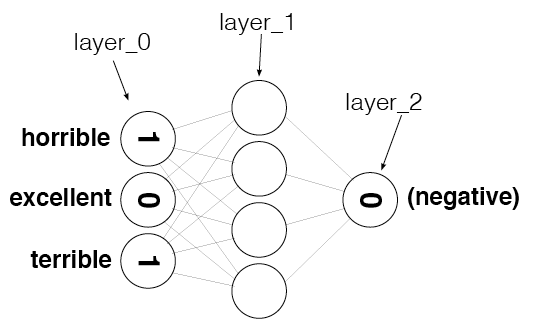

In [21]:
from IPython.display import Image
Image(filename='sentiment_network_2.png')

**TODO:** Create a numpy array called `layer_0` and initialize it to all zeros. You will find the [zeros](https://docs.scipy.org/doc/numpy/reference/generated/numpy.zeros.html) function particularly helpful here. Be sure you create `layer_0` as a 2-dimensional matrix with 1 row and `vocab_size` columns. 

In [22]:
# TODO: Create layer_0 matrix with dimensions 1 by vocab_size, initially filled with zeros
layer_0 = np.zeros((1,vocab_size))

Run the following cell. It should display `(1, 74074)`

In [23]:
layer_0.shape

(1, 74074)

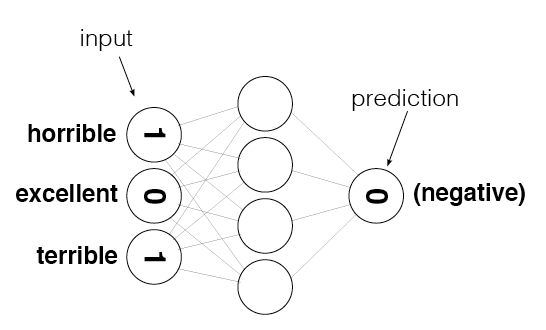

In [41]:
from IPython.display import Image
Image(filename='sentiment_network.png')

`layer_0` contains one entry for every word in the vocabulary, as shown in the above image. We need to make sure we know the index of each word, so run the following cell to create a lookup table that stores the index of every word.

In [46]:
# Create a dictionary of words in the vocabulary mapped to index positions
# (to be used in layer_0)
word2index = {}
for i,word in enumerate(vocab):
    word2index[word] = i
    
# display the map of words to indices
# word2index

**TODO:**  Complete the implementation of `update_input_layer`. It should count 
          how many times each word is used in the given review, and then store
          those counts at the appropriate indices inside `layer_0`.

In [48]:
def update_input_layer(review):
    """ Modify the global layer_0 to represent the vector form of review.
    The element at a given index of layer_0 should represent
    how many times the given word occurs in the review.
    Args:
        review(string) - the string of the review
    Returns:
        None
    """ 
    global layer_0
    # clear out previous state by resetting the layer to be all 0s
    layer_0 *= 0
    word_freq_counter = Counter()
    
    for word in review.split(" "):
        word_freq_counter[word]+=1
        layer_0[0][word2index[word]] = word_freq_counter[word]
        
    # TODO: count how many times each word is used in the given review and store the results in layer_0 

Run the following cell to test updating the input layer with the first review. The indices assigned may not be the same as in the solution, but hopefully you'll see some non-zero values in `layer_0`.  

In [49]:
update_input_layer(reviews[0])
layer_0

array([[18.,  0.,  0., ...,  0.,  0.,  0.]])

**TODO:** Complete the implementation of `get_target_for_labels`. It should return `0` or `1`, 
          depending on whether the given label is `NEGATIVE` or `POSITIVE`, respectively.

In [50]:
def get_target_for_label(label):
    """Convert a label to `0` or `1`.
    Args:
        label(string) - Either "POSITIVE" or "NEGATIVE".
    Returns:
        `0` or `1`.
    """
    # TODO: Your code here
    if label == "POSITIVE":
        return 1
    else : return 0

Run the following two cells. They should print out`'POSITIVE'` and `1`, respectively.

In [51]:
labels[0]

'POSITIVE'

In [52]:
get_target_for_label(labels[0])

1

Run the following two cells. They should print out `'NEGATIVE'` and `0`, respectively.

In [31]:
labels[1]

'NEGATIVE'

In [32]:
get_target_for_label(labels[1])

0

# End of Project 2. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Project 3: Building a Neural Network<a id='project_3'></a>

**TODO:** We've included the framework of a class called `SentimentNetork`. Implement all of the items marked `TODO` in the code. These include doing the following:
- Create a basic neural network much like the networks you've seen in earlier lessons and in Project 1, with an input layer, a hidden layer, and an output layer. 
- Do **not** add a non-linearity in the hidden layer. That is, do not use an activation function when calculating the hidden layer outputs.
- Re-use the code from earlier in this notebook to create the training data (see `TODO`s in the code)
- Implement the `pre_process_data` function to create the vocabulary for our training data generating functions
- Ensure `train` trains over the entire corpus

### Where to Get Help if You Need it
- Re-watch earlier Udacity lectures
- Chapters 3-5 - [Grokking Deep Learning](https://www.manning.com/books/grokking-deep-learning) - (Check inside your classroom for a discount code)

In [54]:
import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews, labels, hidden_nodes = 10, learning_rate = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducable results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels):
        
        review_vocab = set()
        # TODO: populate review_vocab with all of the words in the given reviews
        #       Remember to split reviews into individual words 
        #       using "split(' ')" instead of "split()".
        for review in reviews:
            for word in review.split(' '):
                review_vocab.add(word)
        
        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)
        
        label_vocab = set()
        # TODO: populate label_vocab with all of the words in the given labels.
        #       There is no need to split the labels because each one is a single word.
        for label in labels:
            label_vocab.add(label)
        
        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)
        
        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)
        
        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        # TODO: populate self.word2index with indices for all the words in self.review_vocab
        #       like you saw earlier in the notebook
        for i,word in enumerate(self.review_vocab):
            self.word2index[word]=i 
            
        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        # TODO: do the same thing you did for self.word2index and self.review_vocab, 
        #       but for self.label2index and self.label_vocab instead
        for i,label in enumerate(self.label_vocab):
            self.label2index[label]=i 
         
        
    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Store the number of nodes in input, hidden, and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights
        
        # TODO: initialize self.weights_0_1 as a matrix of zeros. These are the weights between
        #       the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((input_nodes,hidden_nodes))
        
        # TODO: initialize self.weights_1_2 as a matrix of random values. 
        #       These are the weights between the hidden layer and the output layer.
        self.weights_1_2 = np.zeros((hidden_nodes,output_nodes))
        
        # TODO: Create the input layer, a two-dimensional matrix with shape 
        #       1 x input_nodes, with all values initialized to zero
        self.layer_0 = np.zeros((1,input_nodes))
    
        
    def update_input_layer(self,review):
        # TODO: You can copy most of the code you wrote for update_input_layer 
        #       earlier in this notebook. 
        #
        #       However, MAKE SURE YOU CHANGE ALL VARIABLES TO REFERENCE
        #       THE VERSIONS STORED IN THIS OBJECT, NOT THE GLOBAL OBJECTS.
        #       For example, replace "layer_0 *= 0" with "self.layer_0 *= 0"
        
        # clear out previous state by resetting the layer to be all 0s
        self.layer_0 *= 0
        word_freq_counter = Counter()

        for word in review.split(" "):
            word_freq_counter[word]+=1
            self.layer_0[0][word2index[word]] = word_freq_counter[word]
                
    def get_target_for_label(self,label):
        # TODO: Copy the code you wrote for get_target_for_label 
        #       earlier in this notebook. 
        if label == "POSITIVE":
            return 1
        else : return 0
        
    def sigmoid(self,x):
        # TODO: Return the result of calculating the sigmoid activation function
        #       shown in the lectures
        return 1/(1+np.exp(-x)) 
    
    def sigmoid_output_2_derivative(self,output):
        # TODO: Return the derivative of the sigmoid activation function, 
        #       where "output" is the original output from the sigmoid fucntion 
        return output*(1-output)

    def train(self, training_reviews, training_labels):
        
        # make sure out we have a matching number of reviews and labels
        assert(len(training_reviews) == len(training_labels))
        
        # Keep track of correct predictions to display accuracy during training 
        correct_so_far = 0
        
        # Remember when we started for printing time statistics
        start = time.time()

        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        for i in range(len(training_reviews)):
            
            # TODO: Get the next review and its correct label
            review = training_reviews[i]
            label = training_labels[i] 
            
            
            # TODO: Implement the forward pass through the network. 
            #       That means use the given review to update the input layer, 
            #       then calculate values for the hidden layer,
            #       and finally calculate the output layer.
            # 
            #       Do not use an activation function for the hidden layer,
            #       but use the sigmoid activation function for the output layer.
            
            update_input_layer(review)
            output = get_target_for_label(label)
            
            # TODO: Implement the back propagation pass here. 
            #       That means calculate the error for the forward pass's prediction
            #       and update the weights in the network according to their
            #       contributions toward the error, as calculated via the
            #       gradient descent and back propagation algorithms you 
            #       learned in class.
            
            # TODO: Keep track of correct predictions. To determine if the prediction was
            #       correct, check that the absolute value of the output error 
            #       is less than 0.5. If so, add one to the correct_so_far count.
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the training process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i+1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i+1))[:4] + "%")
            if(i % 2500 == 0):
                print("")
    
    def test(self, testing_reviews, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # TODO: Run a forward pass through the network, like you did in the
        #       "train" function. That means use the given review to 
        #       update the input layer, then calculate values for the hidden layer,
        #       and finally calculate the output layer.
        #
        #       Note: The review passed into this function for prediction 
        #             might come from anywhere, so you should convert it 
        #             to lower case prior to using it.
        
        # TODO: The output layer should now contain a prediction. 
        #       Return `POSITIVE` for predictions greater-than-or-equal-to `0.5`, 
        #       and `NEGATIVE` otherwise.
        pass


Run the following cell to create a `SentimentNetwork` that will train on all but the last 1000 reviews (we're saving those for testing). Here we use a learning rate of `0.1`.

In [55]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)

Run the following cell to test the network's performance against the last 1000 reviews (the ones we held out from our training set). 

**We have not trained the model yet, so the results should be about 50% as it will just be guessing and there are only two possible values to choose from.**

In [ ]:
mlp.test(reviews[-1000:],labels[-1000:])

Run the following cell to actually train the network. During training, it will display the model's accuracy repeatedly as it trains so you can see how well it's doing.

In [57]:
mlp.train(reviews[:-1000],labels[:-10000])

bromwell high is a cartoon comedy . it ran at the same time as some other programs about school life  such as  teachers  . my   years in the teaching profession lead me to believe that bromwell high  s satire is much closer to reality than is  teachers  . the scramble to survive financially  the insightful students who can see right through their pathetic teachers  pomp  the pettiness of the whole situation  all remind me of the schools i knew and their students . when i saw the episode in which a student repeatedly tried to burn down the school  i immediately recalled . . . . . . . . . at . . . . . . . . . . high . a classic line inspector i  m here to sack one of your teachers . student welcome to bromwell high . i expect that many adults of my age think that bromwell high is far fetched . what a pity that it isn  t   
Progress:0.0% Speed(reviews/sec):0.0 #Correct:0 #Trained:1 Training Accuracy:0.0%
story of a man who has unnatural feelings for a pig . starts out with a opening scene

Progress:1.14% Speed(reviews/sec):1404. #Correct:0 #Trained:287 Training Accuracy:0.0%i can barely find the words to express how utterly utterly awful this film is . i was sold on the promise of action  with segal and stealth aircraft  which normally make for an entertaining action movie . i can honestly say i  d rather gouge my eyes out with a cocktail stick than have to see this film again . the acting was so awful that it was almost funny . the story was insanely weak  with plot holes so cavernously wide you could fly an f    through them . the script was so poor  if i found out that a   year old wrote it i shouldn  t be in the least surprised . the direction and production is so amateur  i wouldn  t even hire these people to shoot my worst enemies wedding video . utter utter drivel . those responsible for making this movie have cheapened the art  and they should be ashamed of themselves . steven segal should never ever show his face in public again  i can  t imagine what made him a

Progress:2.43% Speed(reviews/sec):1486. #Correct:0 #Trained:609 Training Accuracy:0.0%in texas  seven friends meet in a bar to celebrate the halloween night before going to a party . meanwhile  they call the american nightmare pirate radio for fun and confess their innermost fears . a serial killer  who is listening to their confessions  makes their nightmares come true  killing each one of them in a sadistic way .  american nightmare  is a weird low budget movie that has a horrible beginning without any previous explanation  a woman kills two couples in an isolated camping area  as if it were friday    th . then  the story shifts to a bar  where seven friends are celebrating halloween . from this moment on  the story has a great potential  and the unknown cast has a very reasonable performance  showing also some beautiful breasts and naked bodies  as usual in this type of c production . however  the end of the screenplay does not provide any explanation for the killing instinct and mo

Progress:3.52% Speed(reviews/sec):1426. #Correct:0 #Trained:881 Training Accuracy:0.0%simply not the quality i expected from morris  love brass eye and blue jam  . this is very much like a not so bad student film . what concerns me  in all this is why did it win a bafta    morris makes fun of  enshrined mediocrity   ayn rand  in much of his work  nathan barley  and yet with this piece is urinating down the backs of the talented and telling us its raining   br    br   i just hope as he has chosen a subject i would love to tackle  the humanity of terrorism  four lions  that he isn  t going to cock that up  wasting the opportunity to make a statement about the farce of mainstream ignorance and opinion on this emotive and heavily spun phenomena .  
Progress:3.52% Speed(reviews/sec):1420. #Correct:0 #Trained:882 Training Accuracy:0.0%although time has revealed how some of the effects were done this story of love and adventure still is special .  br    br   if you  ve never seen this film be

Progress:4.98% Speed(reviews/sec):1512. #Correct:0 #Trained:1246 Training Accuracy:0.0%     footlight parade        released           viewed       .  br    br   the ice cream cone is invented in new york .  br    br   kevin after a long and busy break  we hit another busby berkeley musical from warner bros . this time it  s the ultra  fast paced footlight parade  starring james cagney as juggernaut stage producer chester kent . i am     certain that cagney was channeling berkeley with his performance of the irrepressible kent  who has to come up with new ideas for performances every minute . joan blondell is also excellent as the acid  tongued secretary  turned  love interest . the ruby keeler  dick powell subplot is not as major this time but no less enjoyable . one thing that baffled me was berkeley  s performances themselves  which seemed far too extravagant and complex to be performed on any stage  let alone a stage that would be showing a film afterwards . obviously busby doesn  

Progress:6.40% Speed(reviews/sec):1544. #Correct:0 #Trained:1601 Training Accuracy:0.0%i saw this movie last weekend and it is silly and mindless . an ancient curse turns a man into a mummy in his pajamas  the victims are scared senseless and can not run from a slow moving old man . they drop their torches and shiver instead of attempting to ward him off or  duh  burn him . quentin alias mr . fabersham of the honeymooners is married to diane brewster alias miss canfield of leave it to beaver fame  who is unhappy in marriage . wow  love plot . the rest of the cast just follows each other in the tombs and wait for screams to react and run to their aid . the egyptian girl is not bad looking but does not lend much to the film . where is the mummy  really just a curse unleashed . this does not hold a torch to universal mummy films in the least . watch this movie if you need sleep  because you will dose off .  
Progress:6.40% Speed(reviews/sec):1544. #Correct:0 #Trained:1602 Training Accurac

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Progress:20.1% Speed(reviews/sec):1509. #Correct:0 #Trained:5032 Training Accuracy:0.0%  tintin and i  first of all struck me as a masterpiece documentary . the photography and the editing are truly breath  taking  almost anti  dogma  .  br    br   we follow the life of tintin drawer herg through an open  hearted interview from     . the tintin series was drawn on the background of the great ideological fights of the twentieth century . in the midst of these herg has his own demons to fight with  and much of his drawing activity seems like an attempt to tame these and to escape into a world of perfection .  br    br   even though there are spectacular photographic panoramas of drawings from tintin albums and also some reconstructions and reading of passages from the albums  the story of herg is told entirely through interviews and archive material  and never through reconstructions .  br    br   herg lived the turbulent life of a true  suffering artist . but the fantastic world that ca

Progress:21.1% Speed(reviews/sec):1495. #Correct:0 #Trained:5298 Training Accuracy:0.0%man  i really love the new dvd that universal put out . i  ve never seen the sentinel look this good since i had to put up with crappy  grainy vhs tapes for years . unfortunately there are no extras beyond a trailer that looks pretty worse for wear . and avoid the goodtimes dvd at all costs . it sucks .  br    br   anyway  troubled fashion model alison parker  cristina raines  moves into haunted nyc brownstone  only it  s more than just haunted . it  s also a portal to hell and the vatican keeps an old blind priest  john carradine  to keep watch over it and make sure the devils and arch  angels don  t escape .  br    br   this has an all star cast full of old  timey actors like ava gardner  arthur kennedy  jose ferrer etc . . . as well as cameos of upcoming   s stars including christopher walken  jeff goldblum  who  s voice was mysteriously overdubbed  and tom berenger . and you won  t even recognize

Progress:22.6% Speed(reviews/sec):1511. #Correct:0 #Trained:5671 Training Accuracy:0.0%i recently saw this at the     palm springs international film . this is the feature length directorial debut of veteran dutch actress monique van de ven and based on my observation it should be her last . i hate movies that are so implausible that you are picking apart practically every scene . this film immediately leaves you scratching your head . as it begins a young photographer and his girlfriend who works for an international aid organization are having a leisurely drive through the taliban  controlled mountains afghanistan having a conversation about their love when a rocket stops a truck in front of them . they get out of their vehicle to watch as talliban fighters equipped with rocket launchers  machine guns  rifles  handguns and grenades execute all five people in the truck . bob  waldemar torenstra  starts taking pictures of all this when he is spotted by one of the insurgents who lobs a 

Progress:23.8% Speed(reviews/sec):1504. #Correct:0 #Trained:5964 Training Accuracy:0.0%kept my attention from start to finish . great performances added to this tremendous film . mr . pacino once again gives us another brilliant character to enjoy .  
Progress:23.8% Speed(reviews/sec):1503. #Correct:0 #Trained:5965 Training Accuracy:0.0%james bond in the wilderness  well  that  s the way it looks pierce brosnan is after all best known as bond in  tommorrow never dies        and  golden eye         both shot prior to this release . frankly  the film  s two leads are both badly miscast  with brosnan turning in the marginally more convincing performance  and with annie galipeau  as pony  grey owl  s love interest  having to battle with carelessly  written dialogue .  br    br   the two aunts  on the other hand are perfect . but the film is not about aunts . it is about the wilds of the canadian wilderness . and while the photography may be pretty  there is no grit to the harsh reality of 

Progress:24.9% Speed(reviews/sec):1496. #Correct:0 #Trained:6242 Training Accuracy:0.0%el mar is a tough  stark  utterly brilliant  brave work of cinematic art . director agust villaronga  with an adaptation by antoni aloy and biel mesquida of blai bonet  s novel  has created a film that traces the profound effects of war on the minds of children and how that exposure wrecks havoc on adult lives . and though the focus is on war  s heinous tattoo on children  the transference to like effects on soldiers and citizens of adult age is clear . this film becomes one of the finest anti  war documents without resorting to pamphleteering the end result has far greater impact because of its inherent story following children  s march toward adulthood .  br    br   a small group of children are shown in the spanish civil war of spain  threatened with blackouts and invasive nighttime slaughtering of citizens . ramala  nilo mur   tur  david lozano   julia  sergi moreno   and francisca  victoria verg

Progress:26.1% Speed(reviews/sec):1494. #Correct:0 #Trained:6550 Training Accuracy:0.0%this is a gem of a movie not just for people who like fun and quirky premises  but who love the history and traditions of sci  fi and classic hollywood movies . each alien of the martian crew is the embodiment of a classic sci  fi character or member of hollywood royalty and it  s pure pleasure watching them bounce of each other and the residents of big bean .  
Progress:26.2% Speed(reviews/sec):1493. #Correct:0 #Trained:6551 Training Accuracy:0.0%i  m somewhat of a fan of lynche  s work  so i was excited when i found this dvd . unfortunately  i was very let down . it  s a series of short cartoons which attempt to show a disturbing and disgusting sort of humor . the animation is very crude  no doubt done using macromedia . each cartoon has a big fat guy beating up his family and generally acting like a jerk to everyone he knows .  br    br   for people who are not familiar with this vein of animation

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



i happened to catch this film at a screening in brooklyn  it  s difficult to describe the plot it has a lot of wacky characters  but let  s just say i  d have a hard time choosing which one made me laugh the hardest  i wouldn  t know where to begin . even the peripheral roles are well written and well acted .  br    br   there are numerous small touches that make it unique and very enjoyable  it has a few  devices  that pop up and add another hilarious layer . it is refreshing to watch not some recycled stuff i  d seen many times before . if this film could reach a wider audience  i  m certain it would be a real crowd  pleaser  the story is so original and heartfelt .  br    br   there  s a lot here to like  funny back  stories  mishaps and misunderstandings which set up the final act and dramatic conclusion . cross eyed is a very funny movie with a ton of heart it  s a touching story with fast paced comedy woven throughout . definitely worth seeing   
Progress:39.3% Speed(reviews/sec)

Progress:40.7% Speed(reviews/sec):1478. #Correct:0 #Trained:10176 Training Accuracy:0.0%although i have not seen this mini  series in over twenty years i can still remember how the balance between character  plot and tale of marvelous adventures succeeded . the use of special effects was restrained making a more poetic rather than literal telling of the story . the two versions i  ve seen were dubbed  english and french  but the actors appear to speak their own language not just italian so there is a synchronization problem . it does not spoil the story telling . among the cast irene pappas as penelope is the most recognizable to north americans . recommended to all followers of odysseus  ever returning .  
Progress:40.7% Speed(reviews/sec):1478. #Correct:0 #Trained:10177 Training Accuracy:0.0%i will start this off by saying i couldn  t get all the way through it . i picked it up on a rainy day from walmart like the rest of the reviewers on this site . i figured there wasn  t any way i

Progress:41.8% Speed(reviews/sec):1475. #Correct:0 #Trained:10467 Training Accuracy:0.0%oh man  does this movie ever bite  if you were ever afraid of seeing a rehash of the slasher genre  done as cheap as possible and as cautious at the same time  pc  friendly  means no nudity  a classic element of slasher films  cut is it . every cliche is retread without a hint of self  awareness and the acting . oh  the acting redefines the word horror . i should have known better as the direct dutch translation of the title would have tipped me off .  
Progress:41.8% Speed(reviews/sec):1475. #Correct:0 #Trained:10468 Training Accuracy:0.0%this columbo episode is probably noted more for the director  steven spielberg  as one of his early films . it should be looked at for jack cassidy  s role as the murderer who kills his partner in writing to maintain his lifestyle . jack cassidy would appear in a later columbo . after all  columbo meets his match in jack cassidy  s character . he is a mystery writ

Progress:43.3% Speed(reviews/sec):1485. #Correct:0 #Trained:10845 Training Accuracy:0.0%it must be assumed that those who praised this film   the greatest filmed opera ever   didn  t i read somewhere   either don  t care for opera  don  t care for wagner  or don  t care about anything except their desire to appear cultured . either as a representation of wagner  s swan  song  or as a movie  this strikes me as an unmitigated disaster  with a leaden reading of the score matched to a tricksy  lugubrious realisation of the text .  br    br   it  s questionable that people with ideas as to what an opera  or  for that matter  a play  especially one by shakespeare  is  about  should be allowed anywhere near a theatre or film studio syberberg  very fashionably  but without the smallest justification from wagner  s text  decided that parsifal is  about  bisexual integration  so that the title character  in the latter stages  transmutes into a kind of beatnik babe  though one who continues to si

Progress:44.6% Speed(reviews/sec):1487. #Correct:0 #Trained:11172 Training Accuracy:0.0%i got the first bill and ted movie for christmas and i had to get the second when i saw it in a store . this one was  i think  just as funny as the first but a much wierder story . it was funny how they had their own personnal hell and how they had to play death . the funny thing was that they played him in stupid little games like clue . the only thing i  d change is station and death being in the band but other than that it was great .  
Progress:44.6% Speed(reviews/sec):1487. #Correct:0 #Trained:11173 Training Accuracy:0.0%even though an animated film it really bored everyone under at least  .  br    br   as a grown up who grew up in an area with wild horses and native americans  it felt this was a combination of pc mixed in with too many fantasy films created by people who never lived in the area they filmed about . talk to those who have lived on horse back  most treat their animals like family

Progress:45.6% Speed(reviews/sec):1478. #Correct:0 #Trained:11418 Training Accuracy:0.0% . . . and i love it . lots of special effects  and for a movie that  s not made on mega budget  this movie really does great job of creating a fantasy masterpiece . i  m one of the guys who didn  t understand the story at all  but this was still a great flick to watch . it  s definitely up there in standards surpassing bored of the rings  and on par with movies like harry potter . which is saying a lot for a movie again  made on a fraction of the budget of these international hits .  br    br   one thing i really love about this movie is that it so stretches the envelope of adventure movie to come out of hong kong . the topic is exotic and original . production quality is unlike anything seen coming out of hk for fantasy action movie  and acting is great .  br    br   one of the best movies to come out of hong kong  this is the infernal affairs of hong kong fantasy movie  and i hope they  ll contin

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Progress:59.3% Speed(reviews/sec):1480. #Correct:0 #Trained:14830 Training Accuracy:0.0%  gunga din   one of the greatest adventure stories ever told  a story about the british foreign legion in   th century india and a lowly  water  bearer  named gunga din  a local denizen who aspires to be just like his military counterparts three british sergeants whose loyalty and camaraderie for each other extend far beyond the bounds of mere patriotism . their  s is a true and abiding friendship for one another and each would be willing to sacrifice his own life for the good of the other . gunga din longs to be a soldier too  a bugler in particular  but can never attain that rank due to his subordinate social standing . however  heroes are not made according to their social credentials  they  re made through their willingness to sacrifice for the greater good of others . gunga din tries at every turn to prove his mettle  but will he ever attain the rank he so passionately seeks  . . . .  you  re 

Progress:60.4% Speed(reviews/sec):1478. #Correct:0 #Trained:15120 Training Accuracy:0.0%action  adventure . billie clark is twenty years old  very pretty  and without a care in the world  until a brutal street gang violates her life  and she turns into an alley cat bent on revenge  when the gang attacks her grandparents house and her car  billie uses her black belt prowess to fight them off . but at the same time she earns their hatred  and she and her grandparents are marked for vengence . when her grandparents lose their lives to the brutal thugs . billie becomes like a cat stalking her prey  and no prison  police force  boyfriend  or crooked judge can get in the way of her avenging claws . she  s a one  woman vigilante squad  a martial arts queen  a crack shot with no mercy . she  s the alley cat . watch for the dramatic ending versus the gang leader  rated r for nudity  violence  other films with karin mani actress  filmography  avenging angel       . . . . janie soon lee   from he

Progress:61.5% Speed(reviews/sec):1473. #Correct:0 #Trained:15386 Training Accuracy:0.0%blackadder  is probably the blackadder series that people have least heard of  it has basically the same principles as the second and fourth ones and has nothing revolutionary in it . but it is still great  a fiery duke of wellington and a fat foolish dr johnson  writer of the first dictionary in england  make this series one to be reckoned with . there are still more hilarious one  liners to be delivered in this series  and it brings out the humour in a lesser  known era  in historically accurate and enjoyable episodes . blackadder  s third outing is not the most famous and well  known of the lot  but rowan atkinson  s role as a butler to a stupid prince is a funny and effectively done one  and hugh laurie is at his best in this series . very good       
Progress:61.5% Speed(reviews/sec):1473. #Correct:0 #Trained:15387 Training Accuracy:0.0%set in the   s   seed  centers around convicted serial kil

Progress:62.8% Speed(reviews/sec):1475. #Correct:0 #Trained:15710 Training Accuracy:0.0%ah  moonwalker  i  m a huge michael jackson fan  i grew up with his music  thriller was actually the first music video i ever saw apparently . believe it or not there was a time where michael jackson was like a god to people  a time where women fainted at the sight of him before really fainting before seeing the sight of him  sorry  michael . but moonwalker was what started to be a tribute to all of michael  s success of the time right when he released his famous bad album that was record breaking  was the first album to have  top ten singles . michael is an incredible artist  there is no doubt  he writes  sings  dances  but when it comes to acting or keeping a story straight with his audience not so much .  br    br   we start off pretty simple jackson  s music  life  career  success and the mania that was the    s biggest star in the world michael jackson . later on  jackson is a    s style gangst

Progress:64.0% Speed(reviews/sec):1474. #Correct:0 #Trained:16004 Training Accuracy:0.0%i understand that paramount wanted to film this with the rodgers and hart score  but couldn  t work out the copyright problems  so burke and van heusen who wrote the between them the most songs for bing crosby contributed a very nice score .  br    br   i read leonard maltin saying that this movie   fit crosby like a glove  and i couldn  t have put it better . no  it  s not mark twain  s satire  it  s a bing crosby film and in     crosby was the most bankable star in hollywood . for once paramount used technicolor and rhonda fleming was never lovelier on the screen . this was a woman that technicolor was invented for .  br    br   william bendix  s brooklyn origins kinda stand out  but it  s to a good comic effect . the trio of crosby  bendix  and sir cedric hardwicke have a rollicking good time with busy doing nothing . bing has one of his patented upbeat philosophical numbers with if you stub your

Progress:65.3% Speed(reviews/sec):1476. #Correct:0 #Trained:16331 Training Accuracy:0.0%this was an absolutely terrible movie . don  t be lured in by christopher walken or michael ironside . both are great actors  but this must simply be their worst role in history . even their great acting could not redeem this movie  s ridiculous storyline . this movie is an early nineties us propaganda piece . the most pathetic scenes were those when the columbian rebels were making their cases for revolutions . maria conchita alonso appeared phony  and her pseudo  love affair with walken was nothing but a pathetic emotional plug in a movie that was devoid of any real meaning . i am disappointed that there are movies like this  ruining actor  s like christopher walken  s good name . i could barely sit through it .  
Progress:65.3% Speed(reviews/sec):1476. #Correct:0 #Trained:16332 Training Accuracy:0.0%  home room  like  zero day  and  elephant   was inspired by the recent wave of school shootings .

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Progress:78.9% Speed(reviews/sec):1476. #Correct:0 #Trained:19734 Training Accuracy:0.0%kurt russell  s chameleon  like performance  coupled with john carpenter  s flawless filmmaking  makes this one  without a doubt  one of the finest boob  tube bios ever aired . it holds up  too the emotional foundation is strong enough that it  ll never age carpenter has preserved for posterity the power and ultimate poignancy of the life of the one and only king of rock and roll .  i  d been a borderline elvis fan most of my life  but it wasn  t until i saw this mind  blowingly moving movie that i looked beyond the image at the man himself . it was quite a revelation .  elvis remains one of the top ten made  for  tv movies of all time .  
Progress:78.9% Speed(reviews/sec):1476. #Correct:0 #Trained:19735 Training Accuracy:0.0%i  m not going to comb over tlps  s obvious peterbogdanovichian flaws . instead  i shall take a look at the positive aspects of this overrated celluloid pygmy of a film .  br  

Progress:80.0% Speed(reviews/sec):1474. #Correct:0 #Trained:20014 Training Accuracy:0.0%an overblown melodrama typical of its period  mid      s  and appropriate matine food . rock hudson  the hulk everyone always falls in love with  plays his usual stereotype role  but whereas in giant  made the same year  when his material and co  stars  taylor  dean  were above average  in this movie he is just not good enough to raise the calibre beyond a mushy tale of how difficult it is to be both rich and happy . the self  destructive brother and sister  robert stack  reeling his way through the film in a drunken stupor  and dorothy malone  playing a vampish poor little rich girl totally over the top  end up the losers and hudson gets bacall  who is rather wooden in this part which does not have enough character or wit to get her going . to paraphrase oscar wilde  the good end happily and the bad unhappily  that is the meaning of fiction . however  i was interested to read that the film is based

Progress:81.1% Speed(reviews/sec):1472. #Correct:0 #Trained:20297 Training Accuracy:0.0%i believe in keeping religion out of government and out of the movies . when i want a sermon  i  ll go to church  but i don  t want one from a movie . i don  t mind some supernatural themes   after all  religion is about as supernatural as you can get   but this movie had so much preaching in it that i was really annoyed . the landlady reminded me of witches that of seen in other movies . the bad guy even looked like he had horns .  br    br   and what a silly ending the hero went into the meeting and yelled at all of those old men  and that broke the spell . if only life were that simple . i think that when movies are that stupid  they ought to be distributed with a warning danger  preaching contained herein   
Progress:81.1% Speed(reviews/sec):1472. #Correct:0 #Trained:20298 Training Accuracy:0.0%okay  i am a fan of the nightmare series and everyone says on here that this is the worst  but it  s n

Progress:82.4% Speed(reviews/sec):1472. #Correct:0 #Trained:20612 Training Accuracy:0.0%throughout this film  you might think this film is just for kids . well  it is mainly pointed towards them  but it  s also well  rounded enough with the jokes pointed also at the adults in the audience . this time around  the muppet gang try to get on broadway  with the dire straits keeping them from getting it produced  leading them to splitting up . but kermit won  t stop  and his determination keeps things moving along until after getting the deal together he gets hit by a car and sent into amnesia   br    br   it  s a send  up  in part  of those old starring vehicles from the   s with musicals actually as the topic of a musical  only here there  s the usual lot of zaniness and wonderful moments thrown into a pot of hysterically funny moments  lou zealand  s boomerang fish gonzo  s water  stunt display  the whisper campaign  among many others   but also with a lot of heart too . the muppet writer

Progress:83.6% Speed(reviews/sec):1471. #Correct:0 #Trained:20909 Training Accuracy:0.0%i just got the uk   disc special edition of superman  for about   . the additional stuff includes the     feature superman and the mole  men . so i slapped it into the dvd player last night  and here are my findings .  br    br   some initial disappointment  i hadn  t checked  and i think i had it mentally tagged as one of the kirk alyn serials . i  m not a huge fan of george reeves as superman  and i hadn  t seen anything other than the odd clip of kirk alyn  but hey ho  never mind .  br    br   this black and white production runs for less than an hour . it has the feel of a couple of episodes of one of reeves  early tv series  a two  parter  put together for cinema release  although imdb says it was filmed as a cinema release in advance of the first tv series . in any event  it  s an odd choice for reasons i  ll get to later . i  m of an age where i recall tv and movie productions which are limit

Progress:84.8% Speed(reviews/sec):1471. #Correct:0 #Trained:21221 Training Accuracy:0.0%this movie sucked . it really was a waste of my life . the acting was atrocious  the plot completely implausible . long  long story short  these people get  terrorized  by this pathetic  crazed killer   but completely fail to fight back in any manner . and this is after they take a raft on a camping trip  with no gear  and show up at a campsite that is already assembled and completely stocked with food and clothes and the daughters headphones . additionally  after their boat goes missing  they panic that they  re stuck in the woods  but then the daughters boyfriend just shows up and they apparently never consider that they could just hike out of the woods like he did to get to them . like i said  this movie sucks . a complete joke . don  t let your girlfriend talk you into watching it .  
Progress:84.8% Speed(reviews/sec):1471. #Correct:0 #Trained:21222 Training Accuracy:0.0%its no surprise that bus

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Progress:98.8% Speed(reviews/sec):1479. #Correct:0 #Trained:24724 Training Accuracy:0.0%almost every review of this movie i  d seen was pretty bad . it  s not pretty bad  it  s actually pretty good  though not great . the judy garland character could have gotten annoying  but she didn  t allow it to . somewhere along the line  i  ve become a fan of brooding  overbearing  overacting van heflin  at least in the early    s . judy  s singing is great  but the film missed a great chance by not showing more of their relationship . i gave it a  .  
Progress:98.8% Speed(reviews/sec):1479. #Correct:0 #Trained:24725 Training Accuracy:0.0%there has been a lot of love that has been put into wes anderson  s  fantastic mr fox   unfortunately all the love is for himself . granted  there has been a lot of time and effort been put into making this ever so self  consciously quirky universe but if only the same time and effort had been put into the script to try and make it funny . the worrying thing is 

That most likely didn't train very well. Part of the reason may be because the learning rate is too high. Run the following cell to recreate the network with a smaller learning rate, `0.01`, and then train the new network.

In [ ]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])

That probably wasn't much different. Run the following cell to recreate the network one more time with an even smaller learning rate, `0.001`, and then train the new network.

In [ ]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.001)
mlp.train(reviews[:-1000],labels[:-1000])

With a learning rate of `0.001`, the network should finall have started to improve during training. It's still not very good, but it shows that this solution has potential. We will improve it in the next lesson.

# End of Project 3. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Understanding Neural Noise<a id='lesson_4'></a>

The following cells include includes the code Andrew shows in the next video. We've included it here so you can run the cells along with the video without having to type in everything.

In [ ]:
from IPython.display import Image
Image(filename='sentiment_network.png')

In [ ]:
def update_input_layer(review):
    
    global layer_0
    
    # clear out previous state, reset the layer to be all 0s
    layer_0 *= 0
    for word in review.split(" "):
        layer_0[0][word2index[word]] += 1

update_input_layer(reviews[0])

In [ ]:
layer_0

In [ ]:
review_counter = Counter()

In [ ]:
for word in reviews[0].split(" "):
    review_counter[word] += 1

In [ ]:
review_counter.most_common()

# Project 4: Reducing Noise in Our Input Data<a id='project_4'></a>

**TODO:** Attempt to reduce the noise in the input data like Andrew did in the previous video. Specifically, do the following:
* Copy the `SentimentNetwork` class you created earlier into the following cell.
* Modify `update_input_layer` so it does not count how many times each word is used, but rather just stores whether or not a word was used. 

In [ ]:
# TODO: -Copy the SentimentNetwork class from Projet 3 lesson
#       -Modify it to reduce noise, like in the video 

Run the following cell to recreate the network and train it. Notice we've gone back to the higher learning rate of `0.1`.

In [ ]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)
mlp.train(reviews[:-1000],labels[:-1000])

That should have trained much better than the earlier attempts. It's still not wonderful, but it should have improved dramatically. Run the following cell to test your model with 1000 predictions.

In [ ]:
mlp.test(reviews[-1000:],labels[-1000:])

# End of Project 4. 
## Andrew's solution was actually in the previous video, so rewatch that video if you had any problems with that project. Then continue on to the next lesson.
# Analyzing Inefficiencies in our Network<a id='lesson_5'></a>
The following cells include the code Andrew shows in the next video. We've included it here so you can run the cells along with the video without having to type in everything.

In [ ]:
Image(filename='sentiment_network_sparse.png')

In [ ]:
layer_0 = np.zeros(10)

In [ ]:
layer_0

In [ ]:
layer_0[4] = 1
layer_0[9] = 1

In [ ]:
layer_0

In [ ]:
weights_0_1 = np.random.randn(10,5)

In [ ]:
layer_0.dot(weights_0_1)

In [ ]:
indices = [4,9]

In [ ]:
layer_1 = np.zeros(5)

In [ ]:
for index in indices:
    layer_1 += (1 * weights_0_1[index])

In [ ]:
layer_1

In [ ]:
Image(filename='sentiment_network_sparse_2.png')

In [ ]:
layer_1 = np.zeros(5)

In [ ]:
for index in indices:
    layer_1 += (weights_0_1[index])

In [ ]:
layer_1

# Project 5: Making our Network More Efficient<a id='project_5'></a>
**TODO:** Make the `SentimentNetwork` class more efficient by eliminating unnecessary multiplications and additions that occur during forward and backward propagation. To do that, you can do the following:
* Copy the `SentimentNetwork` class from the previous project into the following cell.
* Remove the `update_input_layer` function - you will not need it in this version.
* Modify `init_network`:
>* You no longer need a separate input layer, so remove any mention of `self.layer_0`
>* You will be dealing with the old hidden layer more directly, so create `self.layer_1`, a two-dimensional matrix with shape 1 x hidden_nodes, with all values initialized to zero
* Modify `train`:
>* Change the name of the input parameter `training_reviews` to `training_reviews_raw`. This will help with the next step.
>* At the beginning of the function, you'll want to preprocess your reviews to convert them to a list of indices (from `word2index`) that are actually used in the review. This is equivalent to what you saw in the video when Andrew set specific indices to 1. Your code should create a local `list` variable named `training_reviews` that should contain a `list` for each review in `training_reviews_raw`. Those lists should contain the indices for words found in the review.
>* Remove call to `update_input_layer`
>* Use `self`'s  `layer_1` instead of a local `layer_1` object.
>* In the forward pass, replace the code that updates `layer_1` with new logic that only adds the weights for the indices used in the review.
>* When updating `weights_0_1`, only update the individual weights that were used in the forward pass.
* Modify `run`:
>* Remove call to `update_input_layer` 
>* Use `self`'s  `layer_1` instead of a local `layer_1` object.
>* Much like you did in `train`, you will need to pre-process the `review` so you can work with word indices, then update `layer_1` by adding weights for the indices used in the review.

In [ ]:
# TODO: -Copy the SentimentNetwork class from Project 4 lesson
#       -Modify it according to the above instructions 

Run the following cell to recreate the network and train it once again.

In [ ]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)
mlp.train(reviews[:-1000],labels[:-1000])

That should have trained much better than the earlier attempts. Run the following cell to test your model with 1000 predictions.

In [ ]:
mlp.test(reviews[-1000:],labels[-1000:])

# End of Project 5. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.
# Further Noise Reduction<a id='lesson_6'></a>

In [ ]:
Image(filename='sentiment_network_sparse_2.png')

In [ ]:
# words most frequently seen in a review with a "POSITIVE" label
pos_neg_ratios.most_common()

In [ ]:
# words most frequently seen in a review with a "NEGATIVE" label
list(reversed(pos_neg_ratios.most_common()))[0:30]

In [ ]:
from bokeh.models import ColumnDataSource, LabelSet
from bokeh.plotting import figure, show, output_file
from bokeh.io import output_notebook
output_notebook()

In [ ]:
hist, edges = np.histogram(list(map(lambda x:x[1],pos_neg_ratios.most_common())), density=True, bins=100, normed=True)

p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           title="Word Positive/Negative Affinity Distribution")
p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:], line_color="#555555")
show(p)

In [ ]:
frequency_frequency = Counter()

for word, cnt in total_counts.most_common():
    frequency_frequency[cnt] += 1

In [ ]:
hist, edges = np.histogram(list(map(lambda x:x[1],frequency_frequency.most_common())), density=True, bins=100, normed=True)

p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           title="The frequency distribution of the words in our corpus")
p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:], line_color="#555555")
show(p)

# Project 6: Reducing Noise by Strategically Reducing the Vocabulary<a id='project_6'></a>

**TODO:** Improve `SentimentNetwork`'s performance by reducing more noise in the vocabulary. Specifically, do the following:
* Copy the `SentimentNetwork` class from the previous project into the following cell.
* Modify `pre_process_data`:
>* Add two additional parameters: `min_count` and `polarity_cutoff`
>* Calculate the positive-to-negative ratios of words used in the reviews. (You can use code you've written elsewhere in the notebook, but we are moving it into the class like we did with other helper code earlier.)
>* Andrew's solution only calculates a postive-to-negative ratio for words that occur at least 50 times. This keeps the network from attributing too much sentiment to rarer words. You can choose to add this to your solution if you would like.  
>* Change so words are only added to the vocabulary if they occur in the vocabulary more than `min_count` times.
>* Change so words are only added to the vocabulary if the absolute value of their postive-to-negative ratio is at least `polarity_cutoff`
* Modify `__init__`:
>* Add the same two parameters (`min_count` and `polarity_cutoff`) and use them when you call `pre_process_data`

In [ ]:
# TODO: -Copy the SentimentNetwork class from Project 5 lesson
#       -Modify it according to the above instructions 

Run the following cell to train your network with a small polarity cutoff.

In [ ]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=20,polarity_cutoff=0.05,learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])

And run the following cell to test it's performance. It should be 

In [ ]:
mlp.test(reviews[-1000:],labels[-1000:])

Run the following cell to train your network with a much larger polarity cutoff.

In [ ]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=20,polarity_cutoff=0.8,learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])

And run the following cell to test it's performance.

In [ ]:
mlp.test(reviews[-1000:],labels[-1000:])

# End of Project 6. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Analysis: What's Going on in the Weights?<a id='lesson_7'></a>

In [ ]:
mlp_full = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=0,polarity_cutoff=0,learning_rate=0.01)

In [ ]:
mlp_full.train(reviews[:-1000],labels[:-1000])

In [ ]:
Image(filename='sentiment_network_sparse.png')

In [ ]:
def get_most_similar_words(focus = "horrible"):
    most_similar = Counter()

    for word in mlp_full.word2index.keys():
        most_similar[word] = np.dot(mlp_full.weights_0_1[mlp_full.word2index[word]],mlp_full.weights_0_1[mlp_full.word2index[focus]])
    
    return most_similar.most_common()

In [ ]:
get_most_similar_words("excellent")

In [ ]:
get_most_similar_words("terrible")

In [ ]:
import matplotlib.colors as colors

words_to_visualize = list()
for word, ratio in pos_neg_ratios.most_common(500):
    if(word in mlp_full.word2index.keys()):
        words_to_visualize.append(word)
    
for word, ratio in list(reversed(pos_neg_ratios.most_common()))[0:500]:
    if(word in mlp_full.word2index.keys()):
        words_to_visualize.append(word)

In [ ]:
pos = 0
neg = 0

colors_list = list()
vectors_list = list()
for word in words_to_visualize:
    if word in pos_neg_ratios.keys():
        vectors_list.append(mlp_full.weights_0_1[mlp_full.word2index[word]])
        if(pos_neg_ratios[word] > 0):
            pos+=1
            colors_list.append("#00ff00")
        else:
            neg+=1
            colors_list.append("#000000")

In [ ]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, random_state=0)
words_top_ted_tsne = tsne.fit_transform(vectors_list)

In [ ]:
p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           title="vector T-SNE for most polarized words")

source = ColumnDataSource(data=dict(x1=words_top_ted_tsne[:,0],
                                    x2=words_top_ted_tsne[:,1],
                                    names=words_to_visualize,
                                    color=colors_list))

p.scatter(x="x1", y="x2", size=8, source=source, fill_color="color")

word_labels = LabelSet(x="x1", y="x2", text="names", y_offset=6,
                  text_font_size="8pt", text_color="#555555",
                  source=source, text_align='center')
p.add_layout(word_labels)

show(p)

# green indicates positive words, black indicates negative words